# Plant Disease Detection

In [1]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
from math import exp, sqrt
import glob

In [2]:
train = [cv.imread(file,0) for file in glob.glob("Train_*.pgm")] #Train images are read and assigned to a list.
test =  [cv.imread(file,0) for file in glob.glob("Test_*.pgm")] #Test images are read and assigned to a list.

In [3]:
def remove_lines(image):
    # Remove horizontal, vertical and diagonal lines.
    kernel_1 = np.array([[0, 0, 1],
                         [0, 1, 0],
                         [1, 0, 0]], dtype=np.uint8)
  
    kernel_2 = np.array([[0, 1, 0],
                         [0, 1, 0],
                         [0, 1, 0]], dtype=np.uint8)
 
    kernel_3 = np.array([[1, 0, 0],
                         [0, 1, 0],
                         [0, 0, 1]], dtype=np.uint8)
  
    kernel_4 = np.array([[0, 0, 0],
                         [1, 1, 1],
                         [0, 0, 0]], dtype=np.uint8)
  
    kernel = [kernel_1,kernel_2,kernel_3,kernel_4] #All kernels are merged in one list.
    for i in range (len(kernel)):
        image = cv.morphologyEx(image, cv.MORPH_OPEN, kernel[i], iterations=2) # Open operation is applied twice to remove lines.

    return image
  

In [4]:
import logging

# Homomorphic filter class
class HomomorphicFilter:
    """Homomorphic filter implemented with diferents filters and an option to an external filter.
    Low-pass filters implemented:
        butterworth
        gaussian
    Attributes:
        a, b: Floats used on emphasis filter:
            H = a + b*H
    """
    
    def __init__(self, a = 0.5, b = 1.5):
        self.a = float(a)
        self.b = float(b)

    # Filters
    def __butterworth_filter(self, I_shape, filter_params):
        P = I_shape[0]/2
        Q = I_shape[1]/2
        U, V = np.meshgrid(range(I_shape[0]), range(I_shape[1]), sparse=False, indexing='ij')
        Duv = (((U-P)**2+(V-Q)**2)).astype(float)
        H = 1/(1+(Duv/filter_params[0]**2)**filter_params[1])
        return (1 - H)

    def __gaussian_filter(self, I_shape, filter_params):
        P = I_shape[0]/2
        Q = I_shape[1]/2
        H = np.zeros(I_shape)
        U, V = np.meshgrid(range(I_shape[0]), range(I_shape[1]), sparse=False, indexing='ij')
        Duv = (((U-P)**2+(V-Q)**2)).astype(float)
        H = np.exp((-Duv/(2*(filter_params[0])**2)))
        return (1 - H)

    # Methods
    def __apply_filter(self, I, H):
        H = np.fft.fftshift(H)
        I_filtered = (self.a + self.b*H)*I
        return I_filtered

    def filter(self, I, filter_params, filter='butterworth', H = None):
        
        """
        Method to apply homormophic filter on an image
        Attributes:
            I: Single channel image
            filter_params: Parameters to be used on filters:
                butterworth:
                    filter_params[0]: Cutoff frequency 
                    filter_params[1]: Order of filter
                gaussian:
                    filter_params[0]: Cutoff frequency
            filter: Choose of the filter, options:
                butterworth
                gaussian
                external
            H: Used to pass external filter
        """

        #  Validating image
        if len(I.shape) != 2:
            print(I.shape)
            raise Exception('Improper image')

        # Take the image to log domain and then to frequency domain 
        I_log = np.log1p(np.array(I, dtype="float"))
        I_fft = np.fft.fft2(I_log)

        # Filters
        if filter=='butterworth':
            H = self.__butterworth_filter(I_shape = I_fft.shape, filter_params = filter_params)
        elif filter=='gaussian':
            H = self.__gaussian_filter(I_shape = I_fft.shape, filter_params = filter_params)
        elif filter=='external':
            print('external')
            if len(H.shape) != 2:
                raise Exception('Invalid external filter')
        else:
            raise Exception('Selected filter not implemented')
        
        # Apply filter on frequency domain then take the image back to spatial domain
        I_fft_filt = self.__apply_filter(I = I_fft, H = H)
        I_filt = np.fft.ifft2(I_fft_filt)
        I = np.exp(np.real(I_filt))-1
        return np.uint8(I)
# End of class HomomorphicFilter

In [5]:
def detect_disease(image, idx): #image input must be train or test and idx input must be less than 4
    image_copy = image[idx].copy() #Input image copied.

    laplacian_var = cv.Laplacian(image_copy,cv.CV_64F).var()  #Laplacian variance calculated.
    homo_filter = HomomorphicFilter(a = 0.9615, b = 1) # a is y-offset of filter, b is coefficient of the filter
    homo_filtered = homo_filter.filter(I=image_copy, filter_params=[30,2]) #Filter order is 2 and cutoff frequency is 30

    #Depending on Laplacian variance, sharpening mask is selected
    if laplacian_var < 500: #If Laplacian variance is less than 500, that means image is blurry it needs to be sharpened more.
        kernel = np.array([[-1,-1, -1], 
                           [-1, 9, -1],
                           [-1,-1, -1]])
    else:
        kernel = np.array([[0,-1, 0], 
                           [-1,5,-1],
                           [0,-1, 0]])

    sharpened = cv.filter2D(homo_filtered, -1, kernel) #Sharpening image obtained
    median = cv.medianBlur(sharpened,3) #Median filter applied for noise reduction

    _,th = cv.threshold(median,154,255,cv.THRESH_BINARY) #Thresholding the image. Threshold value is chosen experimentally.

    #Structuring elements are determined as ellipses with different sizes. 
    kernel3x3 = cv.getStructuringElement(cv.MORPH_ELLIPSE,(3,3)) 
    kernel5x5 = cv.getStructuringElement(cv.MORPH_ELLIPSE,(5,5))
    kernel13x13 = cv.getStructuringElement(cv.MORPH_ELLIPSE,(13,13))

    #Morphological operations are done.
    opening = cv.morphologyEx(th, cv.MORPH_OPEN, kernel3x3) #Small grains removed
    closing = cv.morphologyEx(opening, cv.MORPH_CLOSE, kernel13x13) #Kernel is bigger because we need to retreive objects.
    lines = remove_lines(closing) #Leaf veins are removed
    fillingholes = cv.dilate(lines, kernel5x5,iterations = 1)
    gradient = cv.morphologyEx(fillingholes, cv.MORPH_GRADIENT, kernel3x3) #Obtaines thick edges
    
    contours, hierarchy = cv.findContours(image=gradient, mode=cv.RETR_TREE, method=cv.CHAIN_APPROX_NONE) #Found contours in image
    cv.drawContours(image=image_copy, contours=contours, contourIdx=-1, color=(0, 255, 0), thickness = 1, lineType=cv.LINE_AA) 
    #Found contours are superimposed on original image

    plt.figure(figsize= (13,8))   
    plt.title("Homomorphic Filter Output")
    plt.imshow(homo_filtered,cmap = 'gray')
    plt.show()
    
    plt.figure(figsize= (13,8))   
    plt.title("Sharpened Image")
    plt.imshow(sharpened,cmap = 'gray')
    plt.show()
    
    plt.figure(figsize= (13,8))   
    plt.title("Median Image")
    plt.imshow(median,cmap = 'gray')
    plt.show()
    
    plt.figure(figsize= (13,8))   
    plt.title("Thresholded Image")
    plt.imshow(th,cmap = 'gray')
    plt.show()
    
    plt.figure(figsize= (13,8))   
    plt.title("Opened Image")
    plt.imshow(opening,cmap = 'gray')
    plt.show()

    plt.figure(figsize= (13,8))   
    plt.title("Closed Image")
    plt.imshow(closing,cmap = 'gray')
    plt.show()
    
    plt.figure(figsize= (13,8))   
    plt.title("Removed Leaf Veins")
    plt.imshow(lines,cmap = 'gray')
    plt.show()

    plt.figure(figsize= (13,8))   
    plt.title("Dilated Image")
    plt.imshow(fillingholes,cmap = 'gray')
    plt.show()

    plt.figure(figsize= (13,8))   
    plt.title("Gradient Image")
    plt.imshow(gradient,cmap = 'gray')
    plt.show()

    plt.figure(figsize= (13,8))  
    plt.title("Disase Detected Image")
    plt.imshow(image_copy,cmap = "gray")
    plt.show()

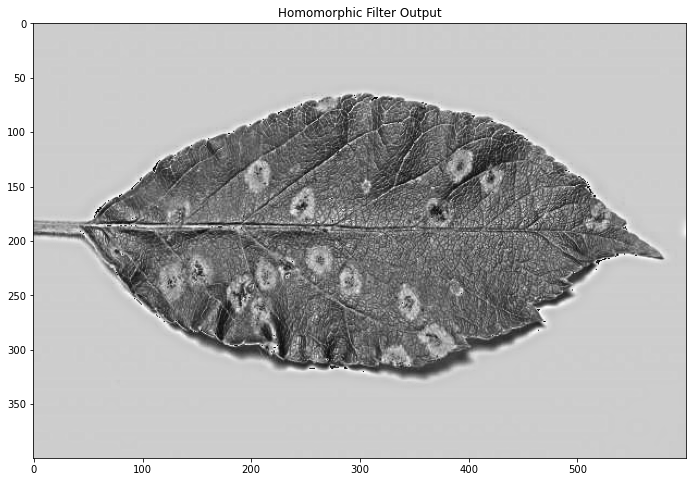

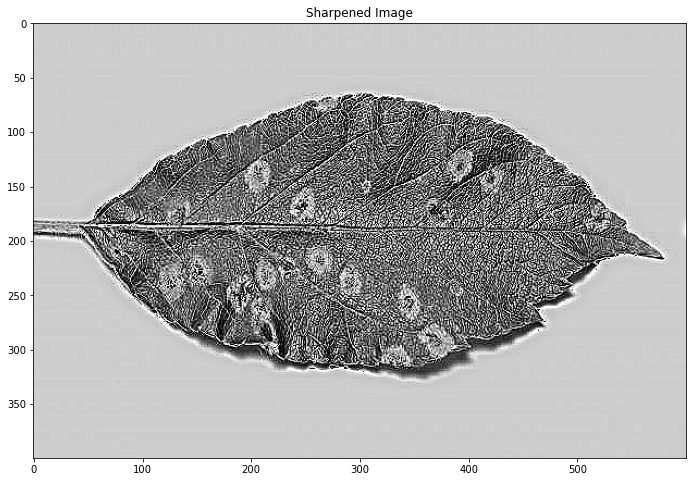

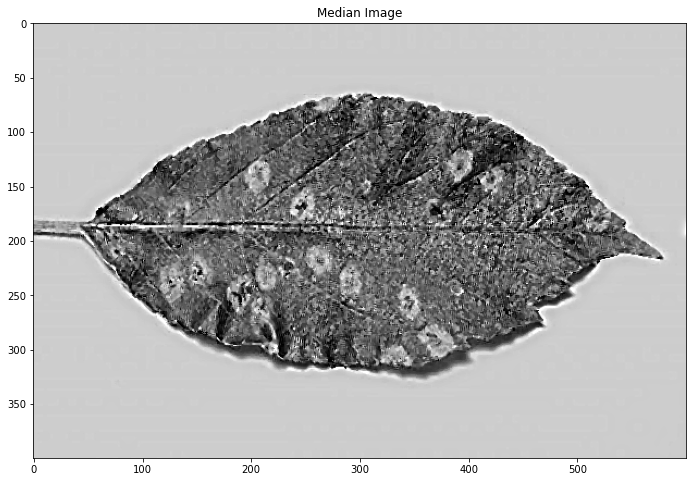

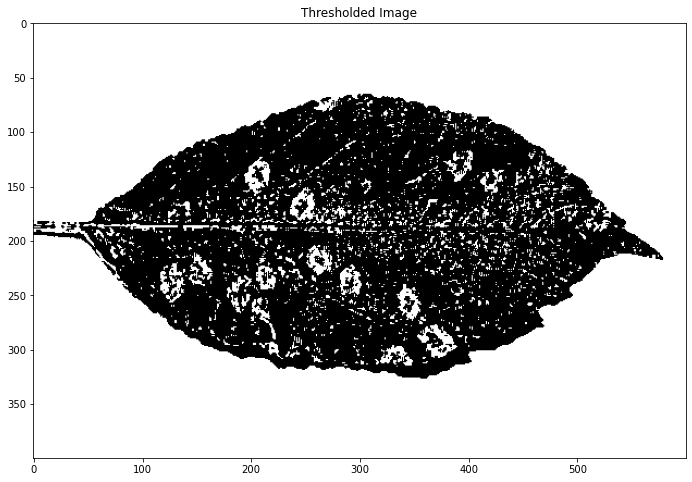

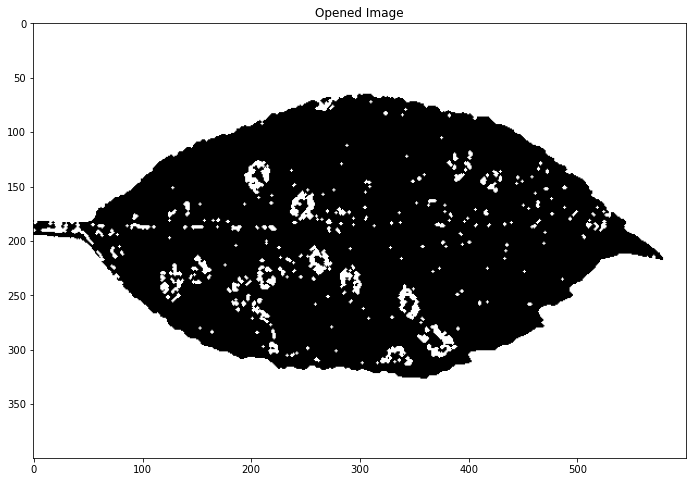

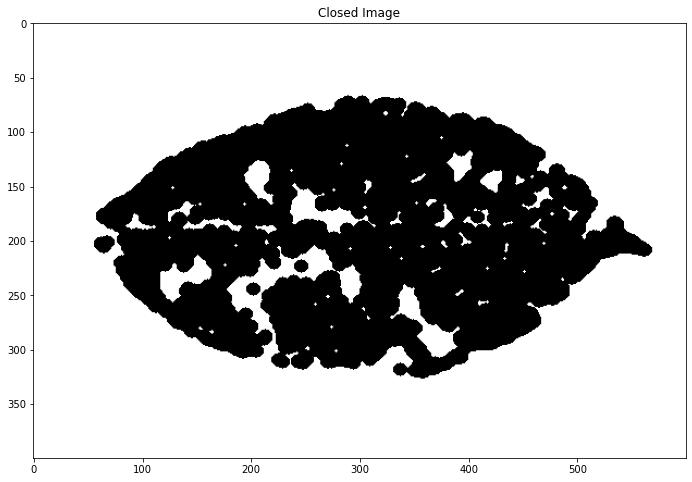

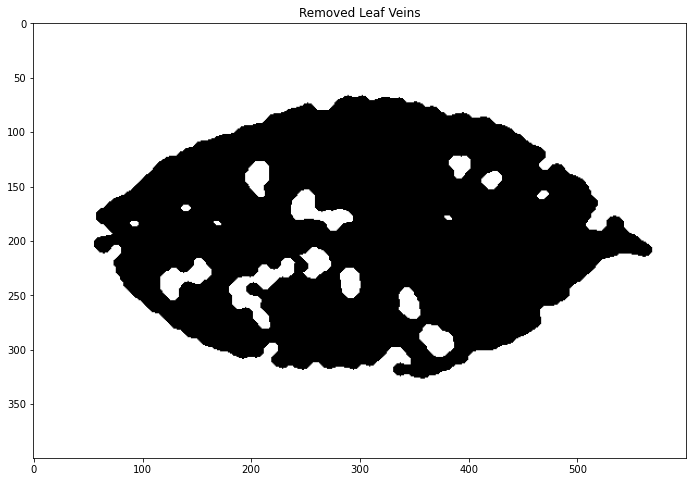

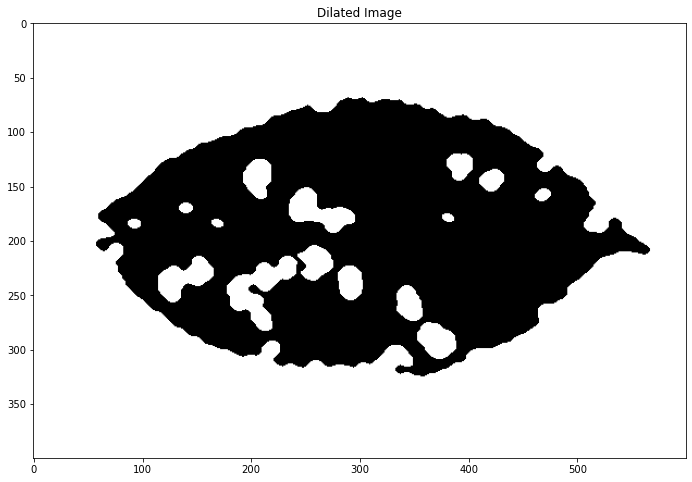

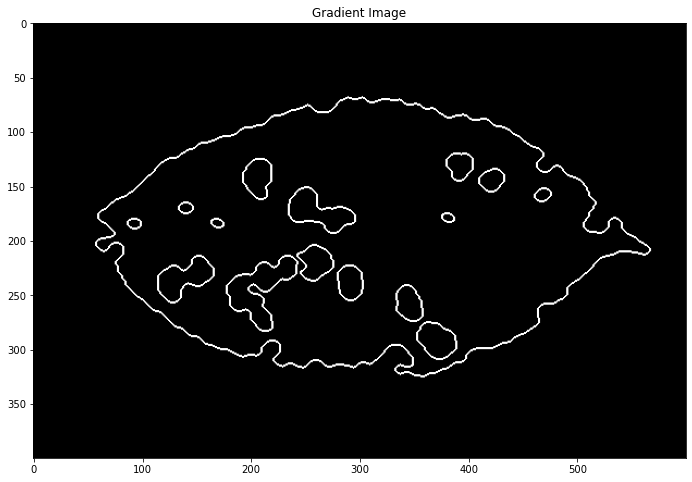

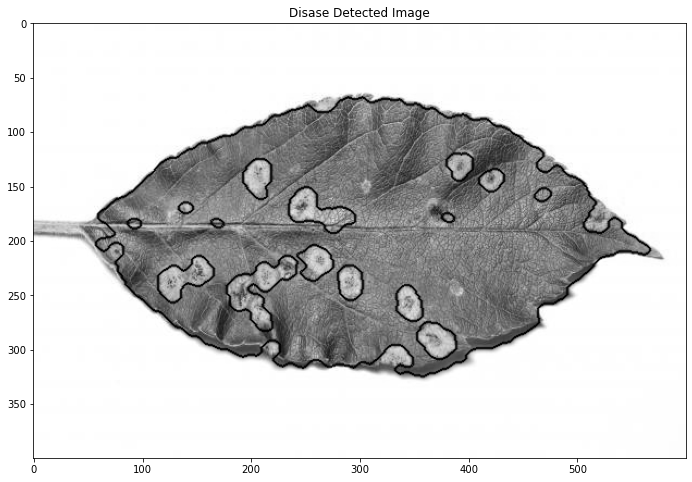

In [6]:
detect_disease(train, 0)

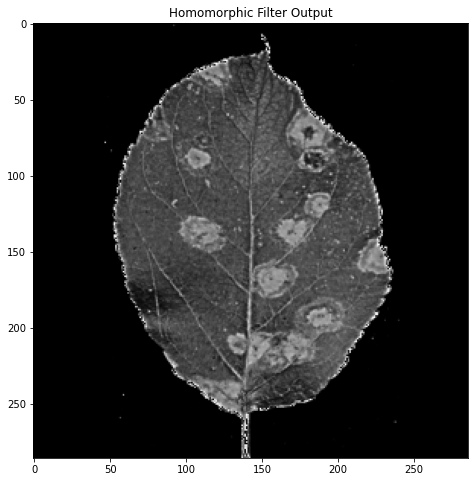

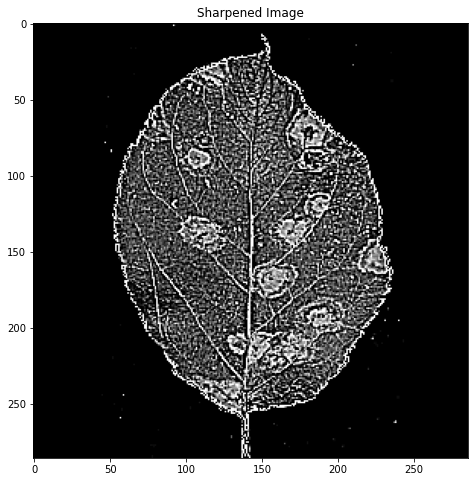

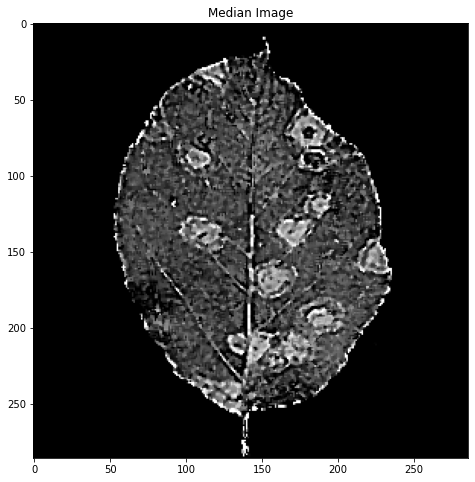

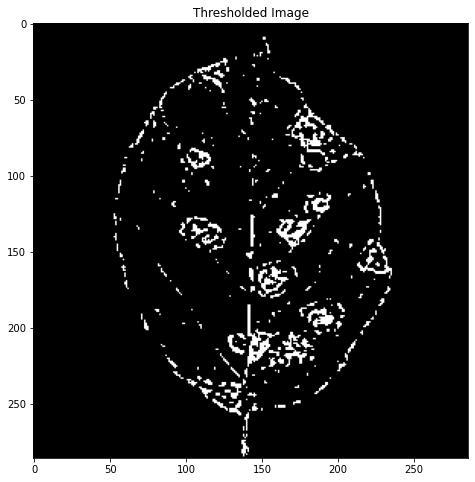

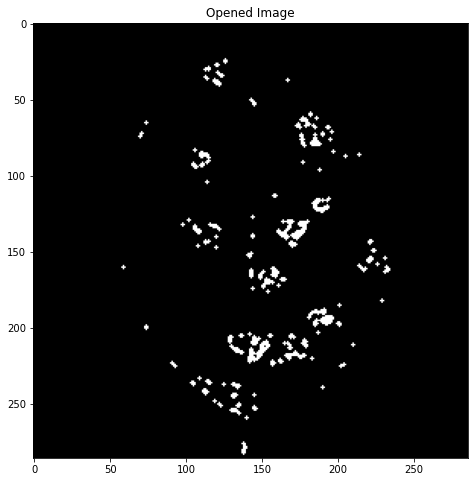

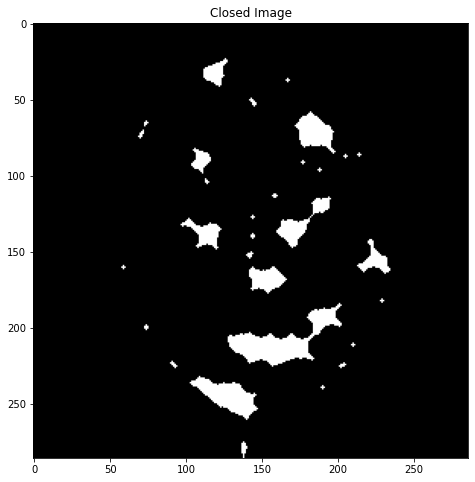

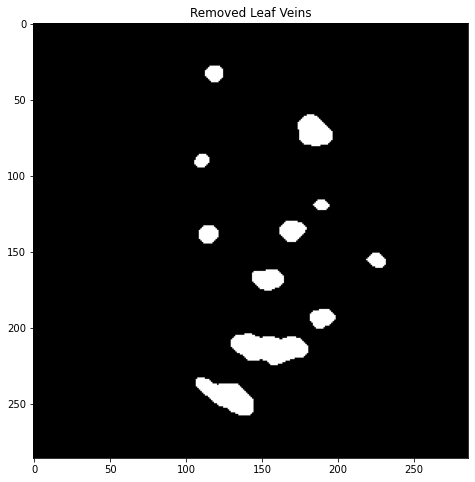

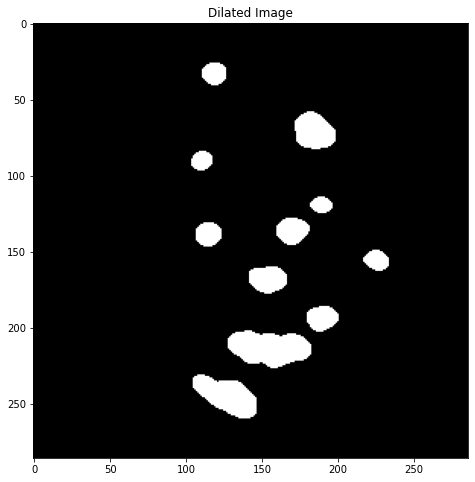

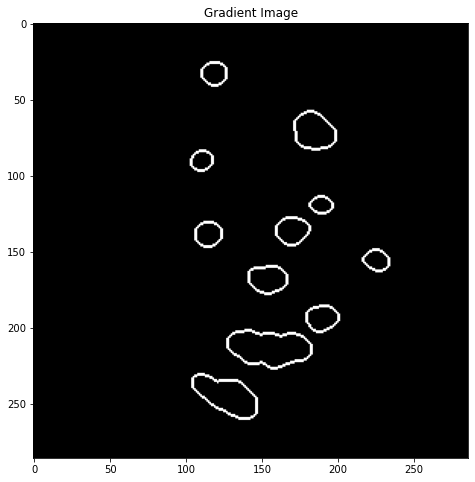

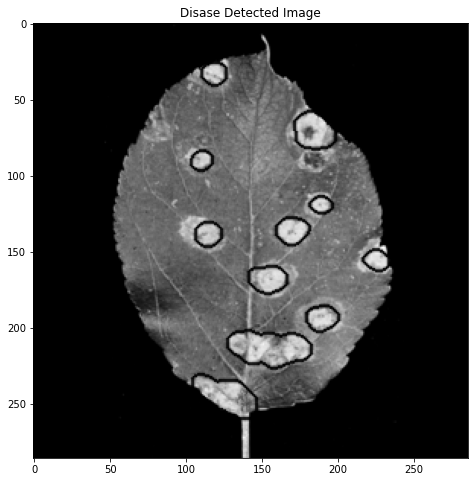

In [7]:
detect_disease(train, 1)

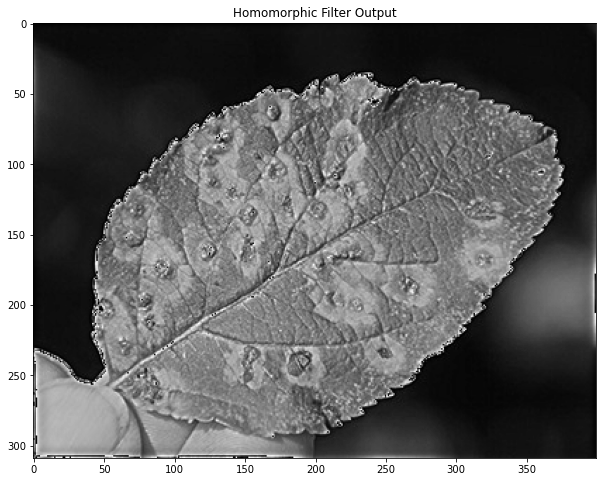

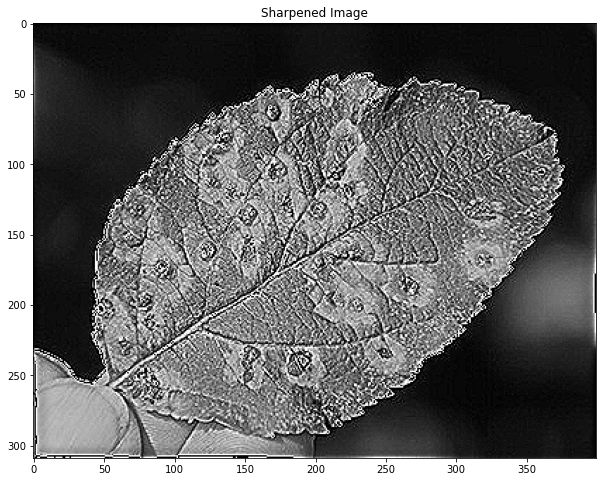

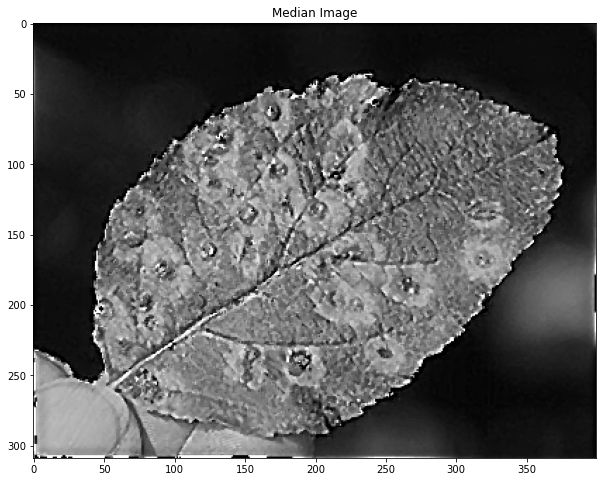

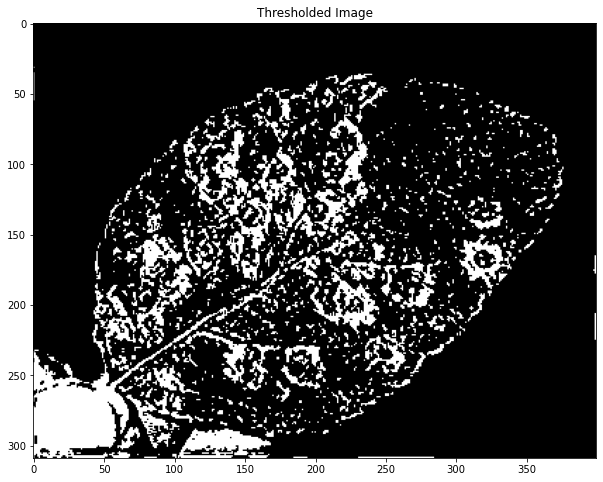

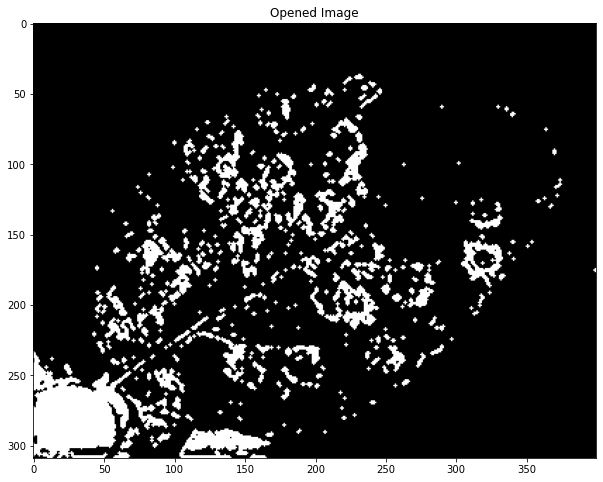

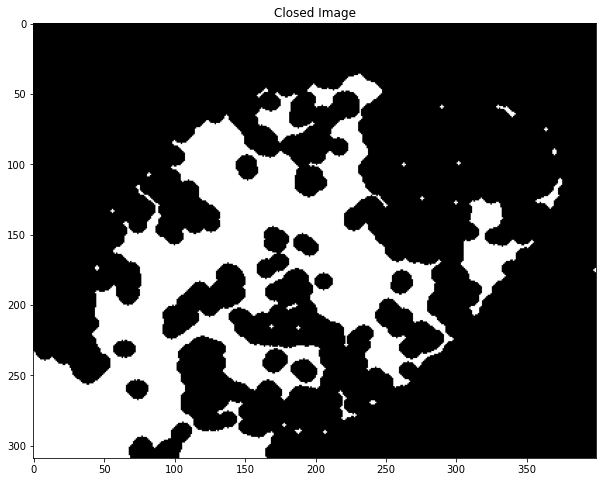

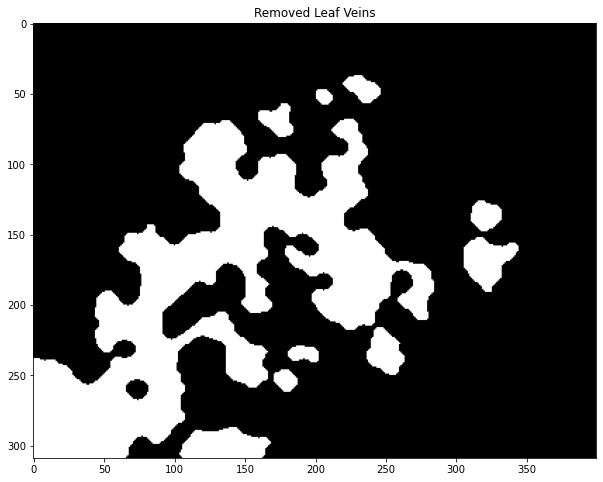

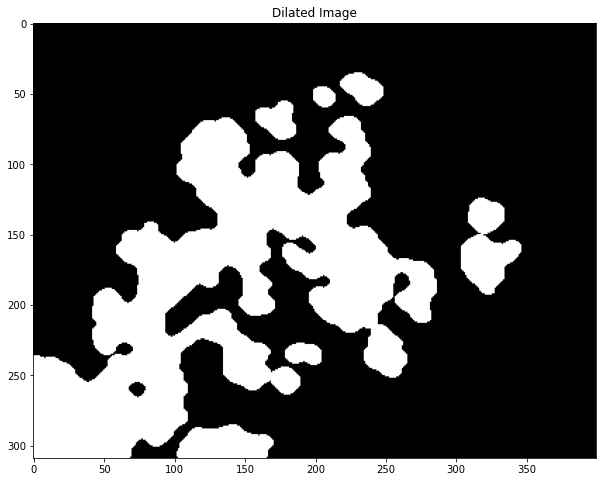

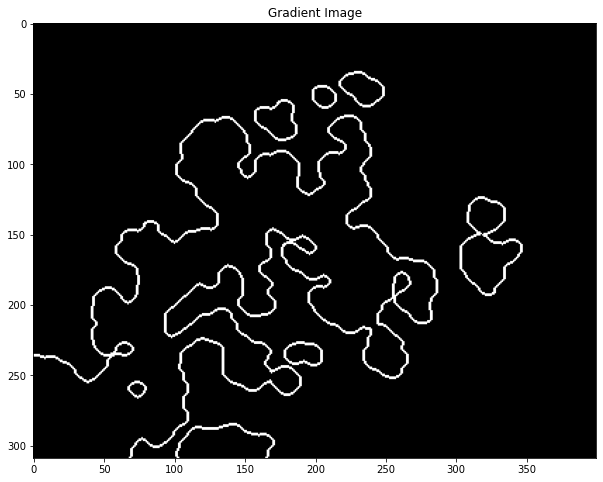

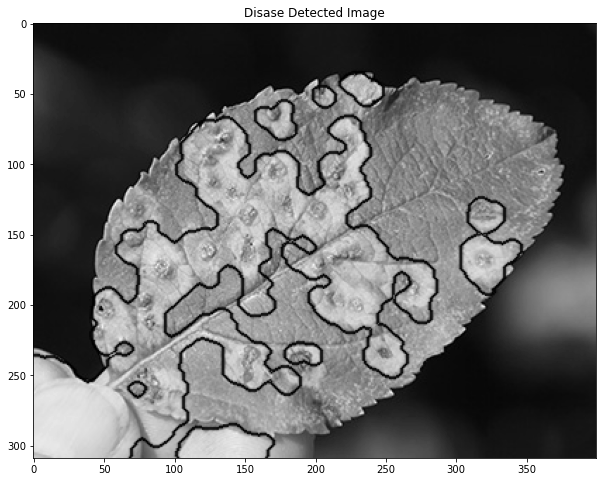

In [8]:
detect_disease(train, 2)

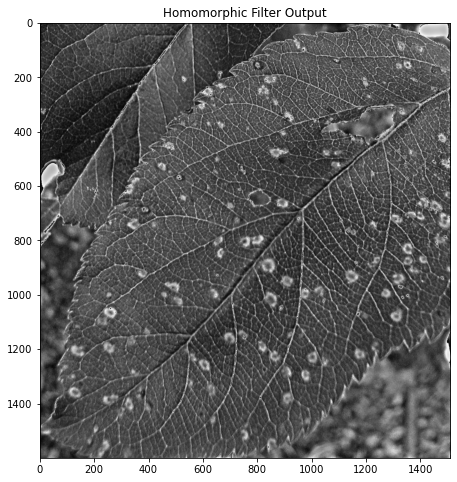

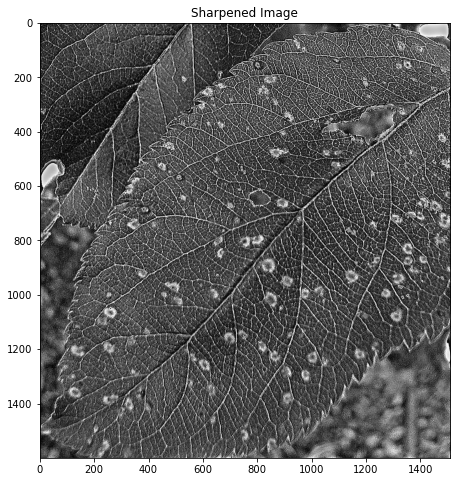

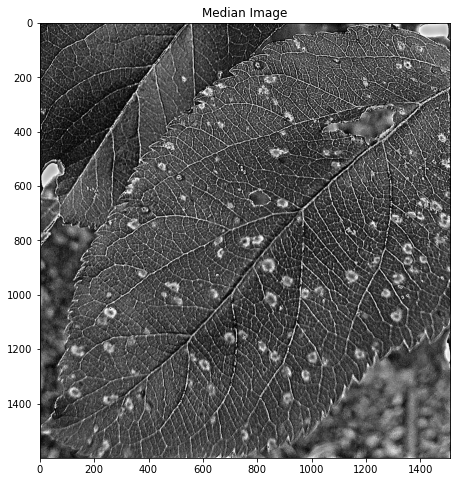

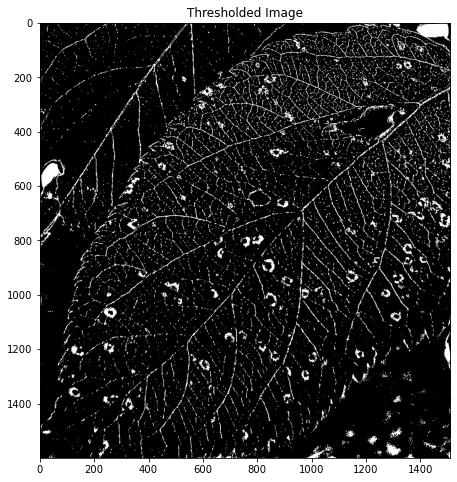

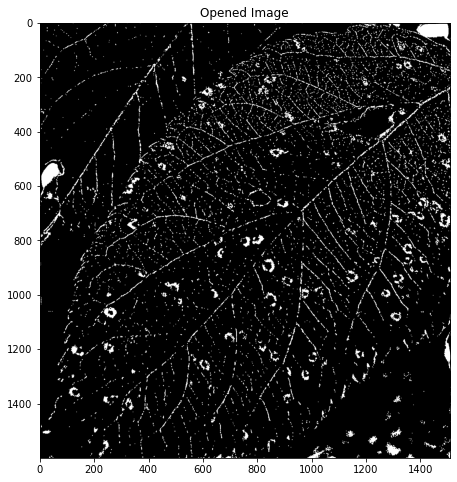

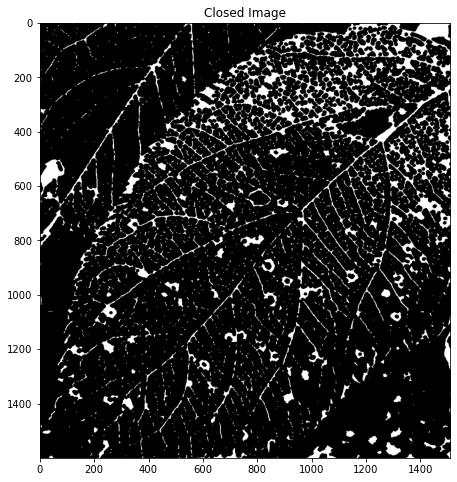

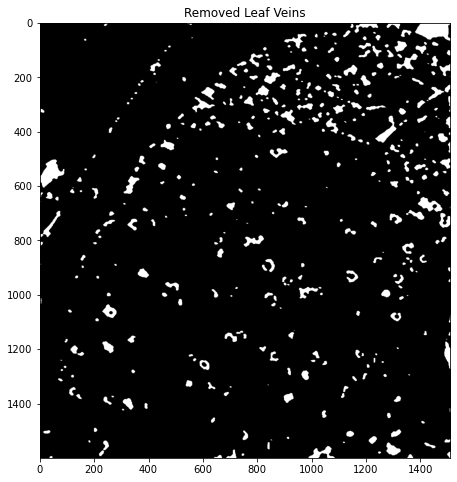

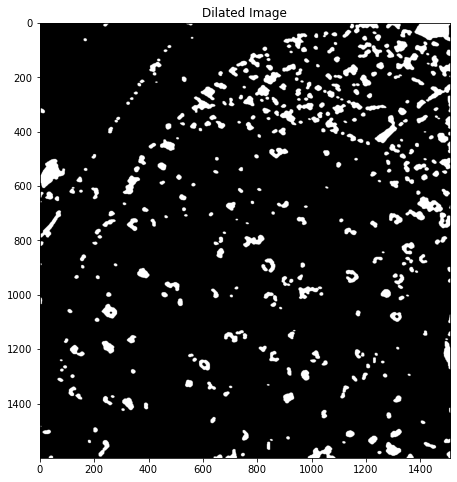

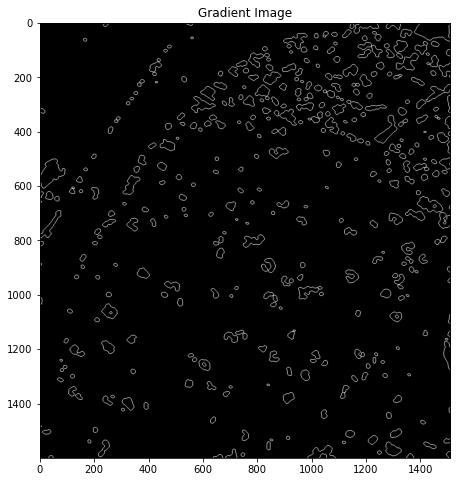

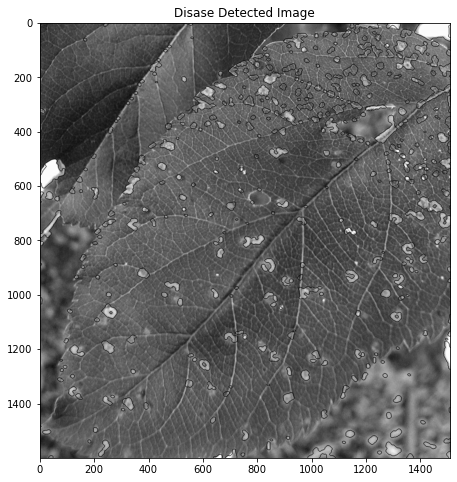

In [9]:
detect_disease(train, 3)

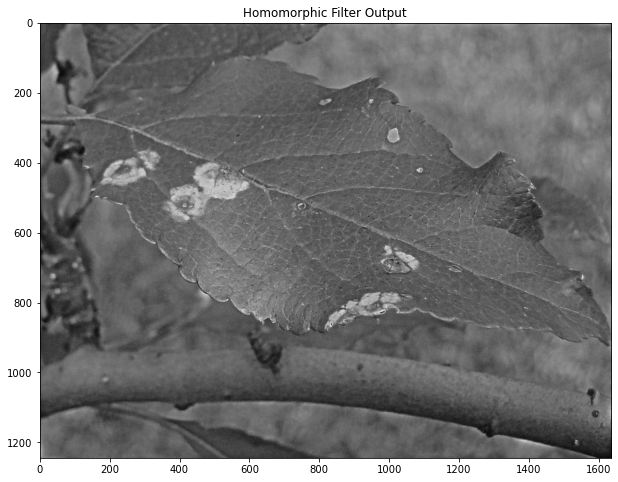

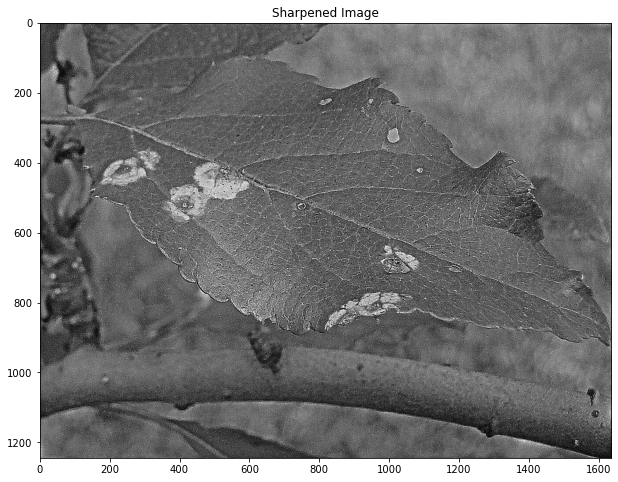

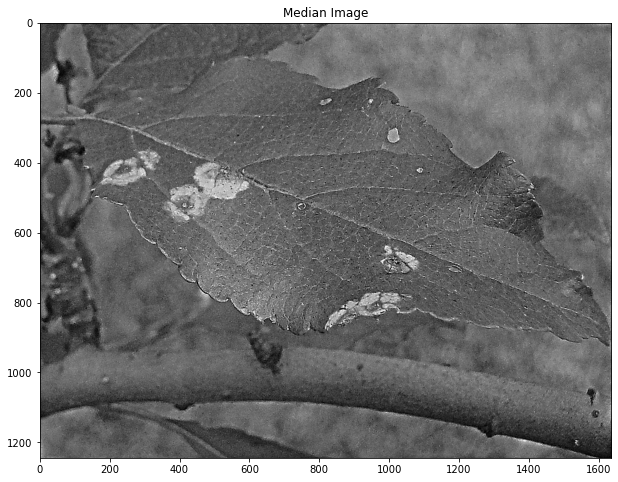

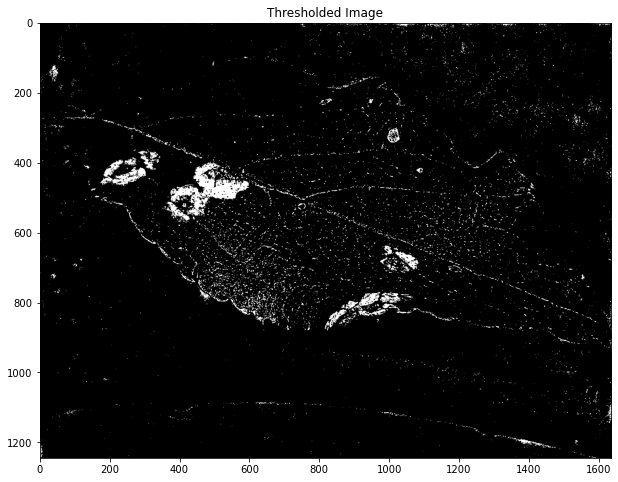

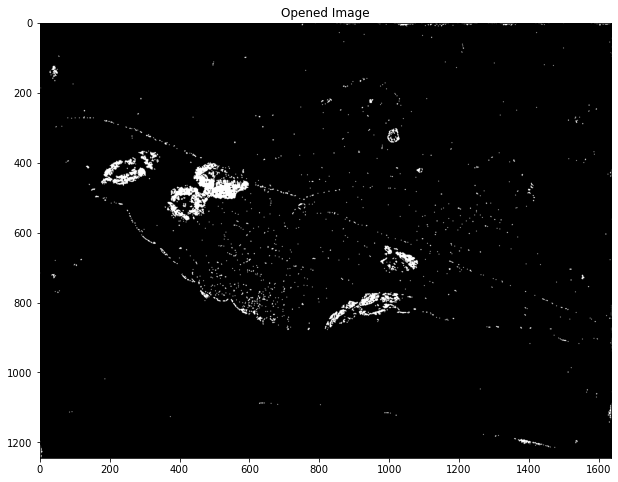

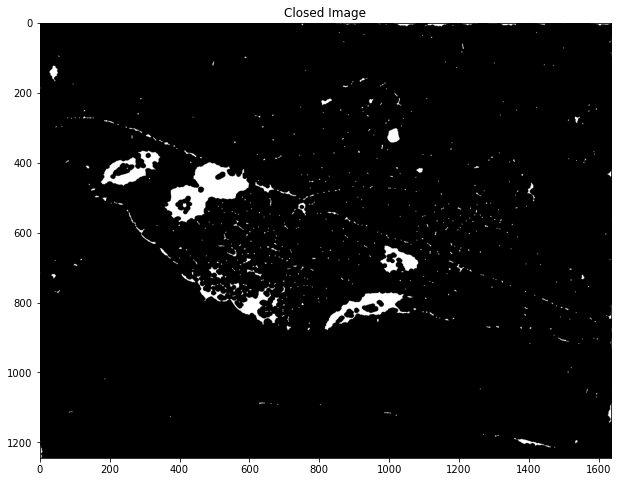

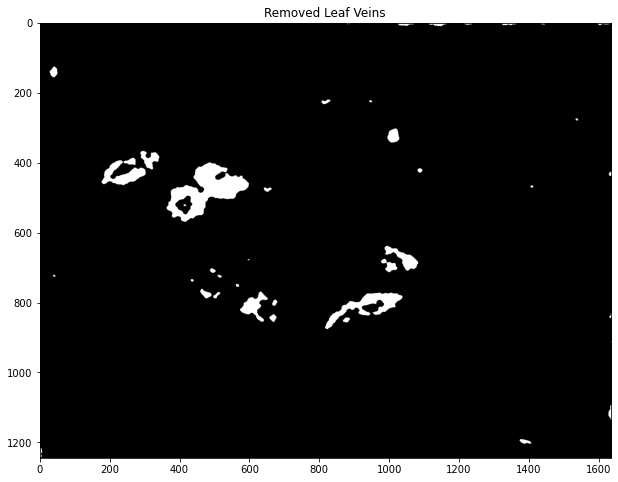

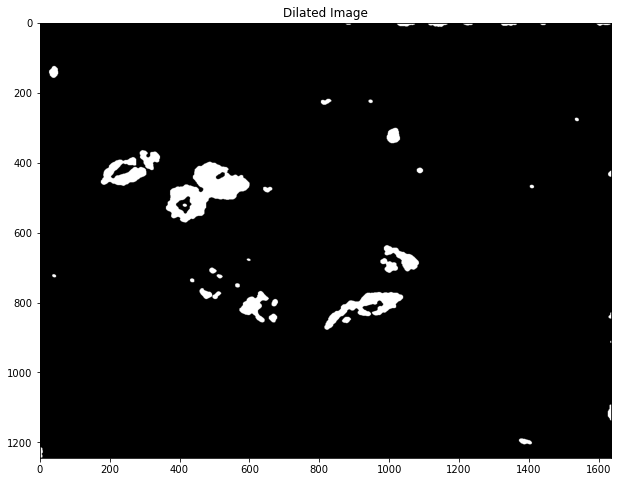

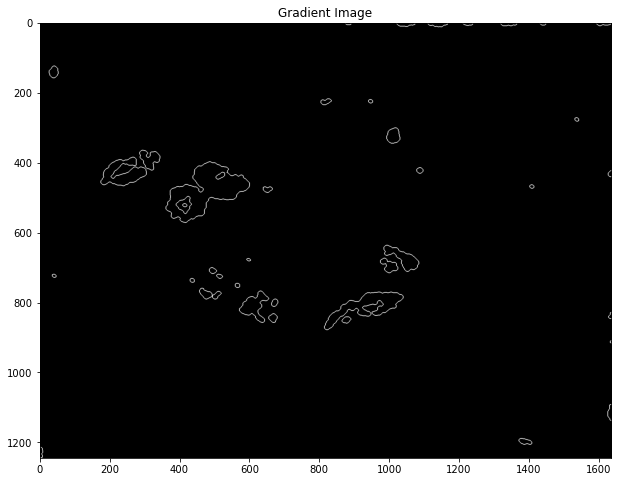

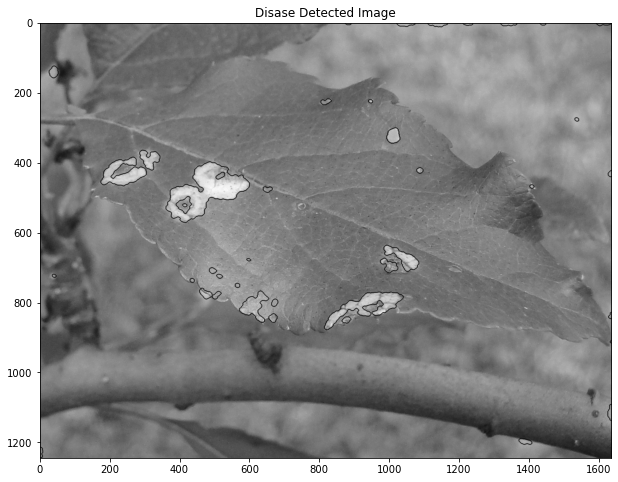

In [10]:
detect_disease(test, 0)

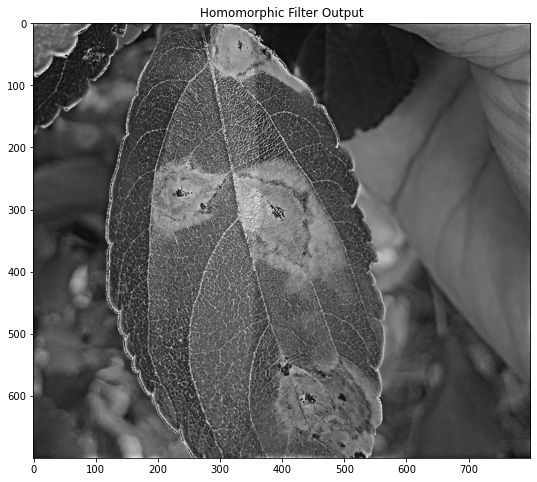

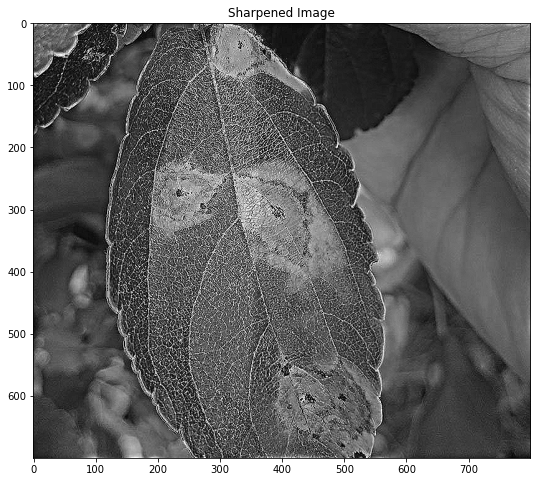

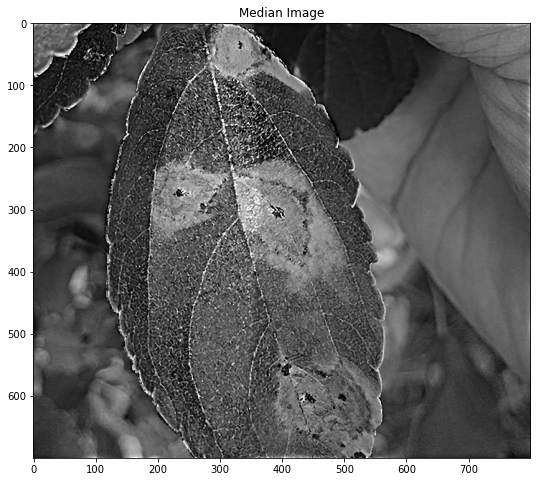

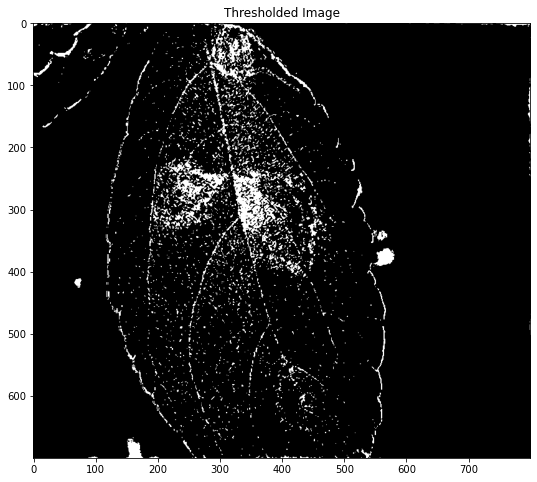

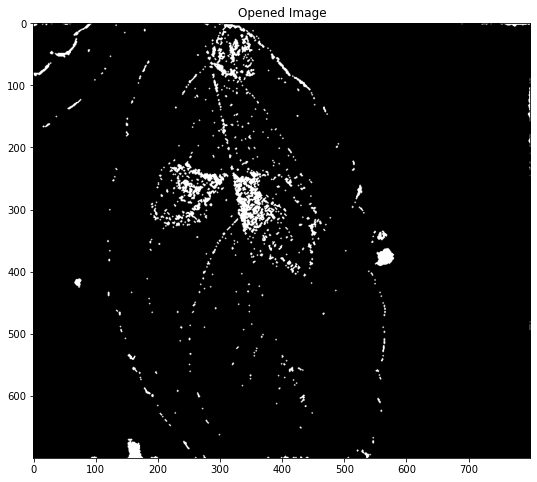

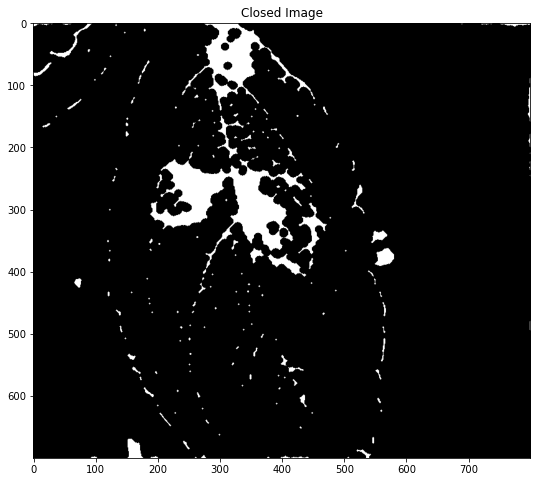

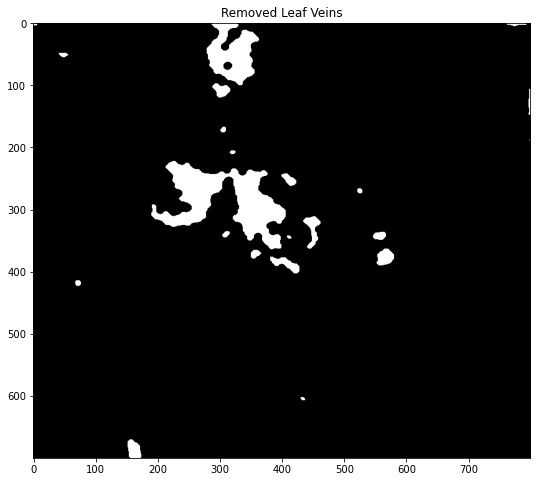

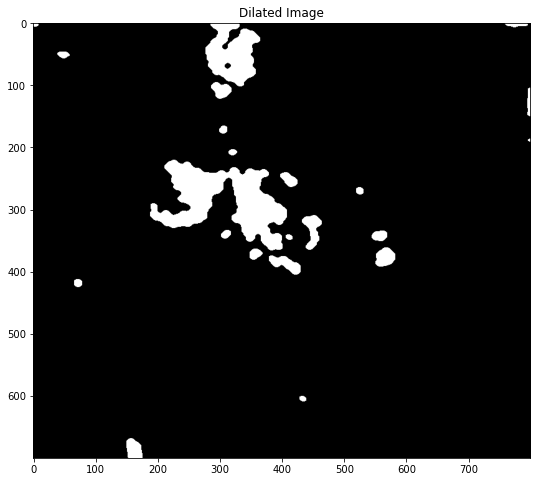

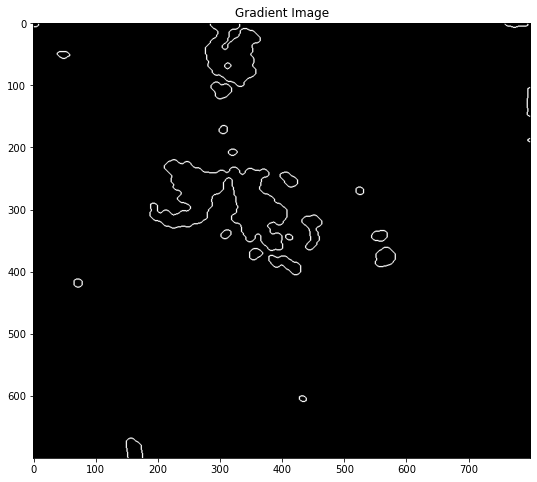

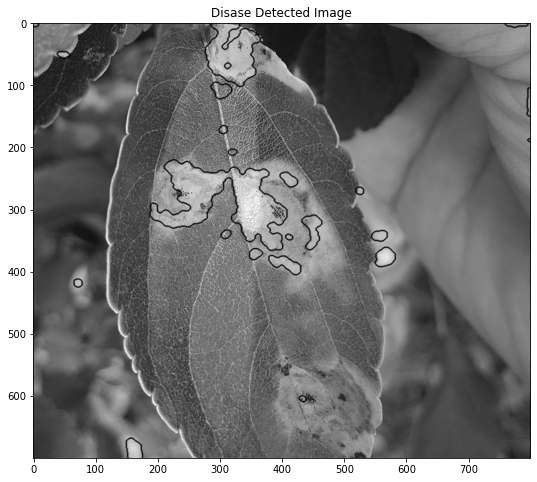

In [11]:
detect_disease(test, 1)

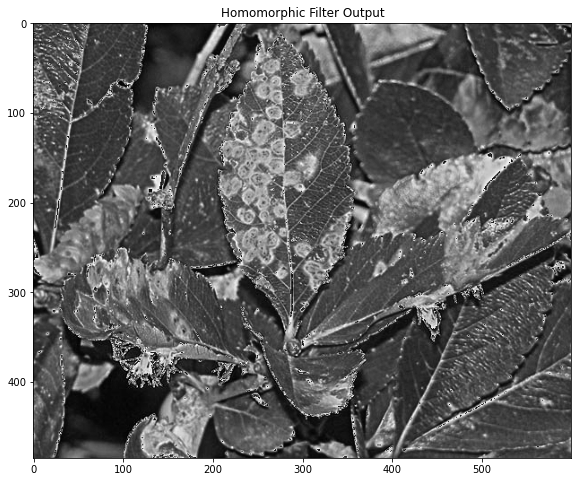

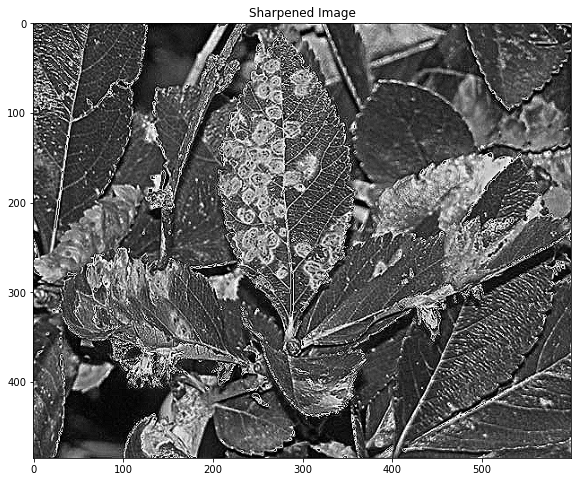

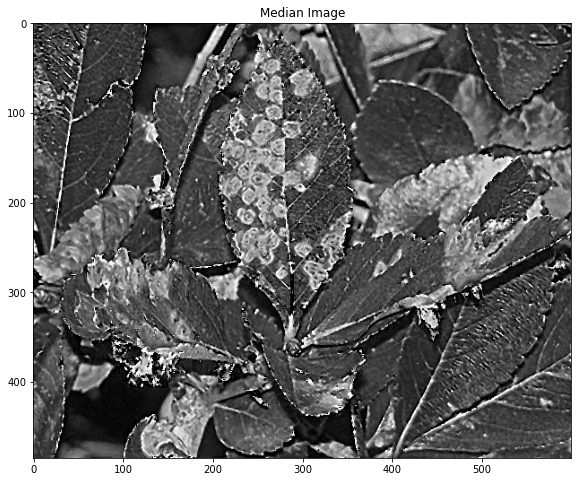

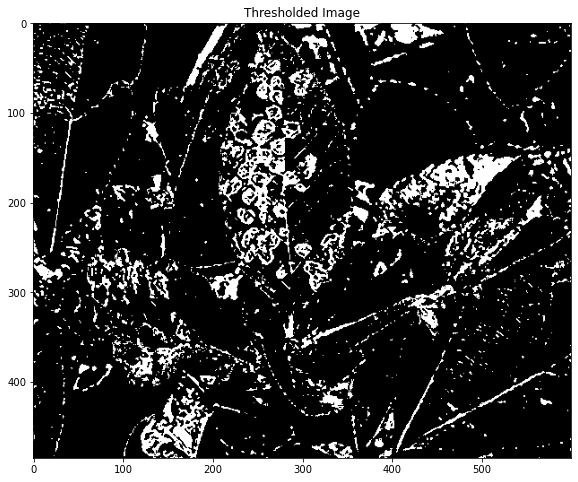

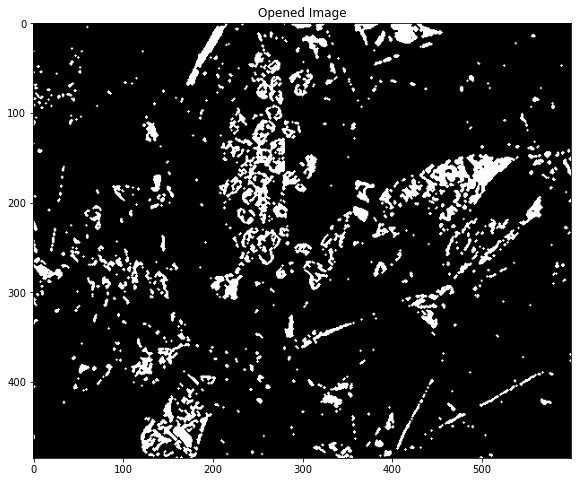

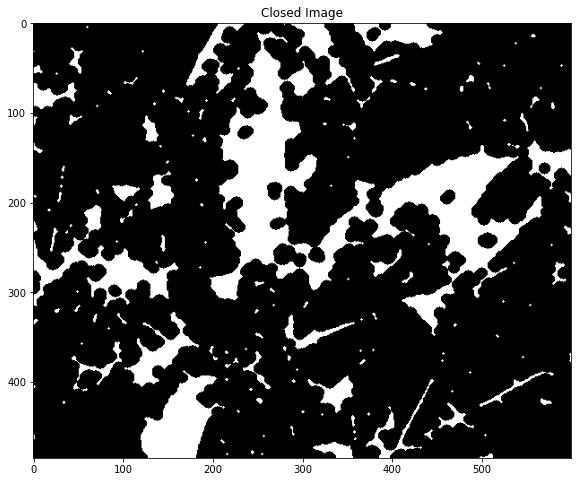

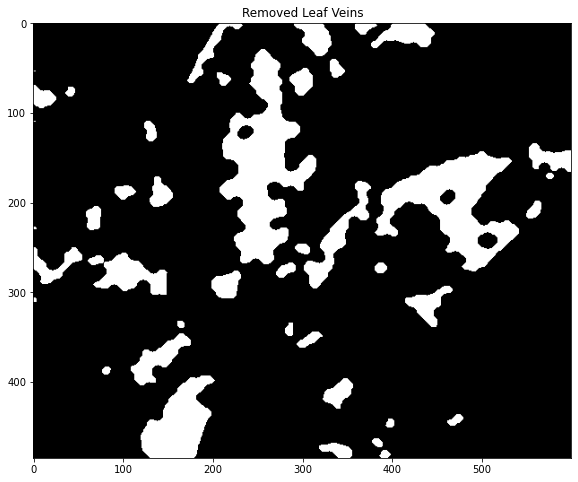

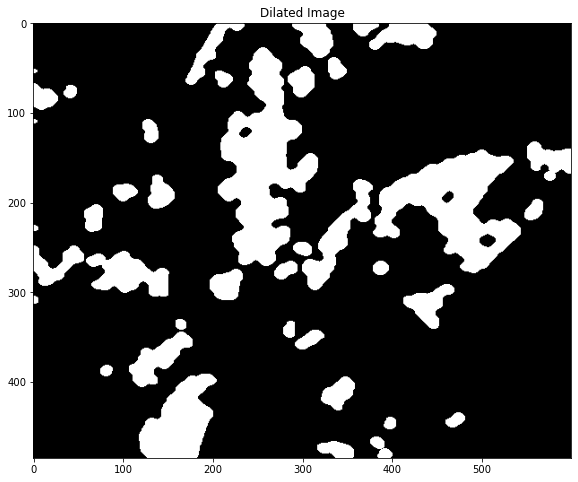

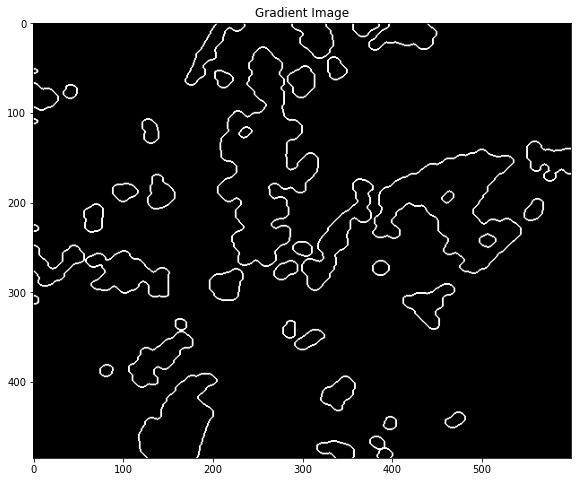

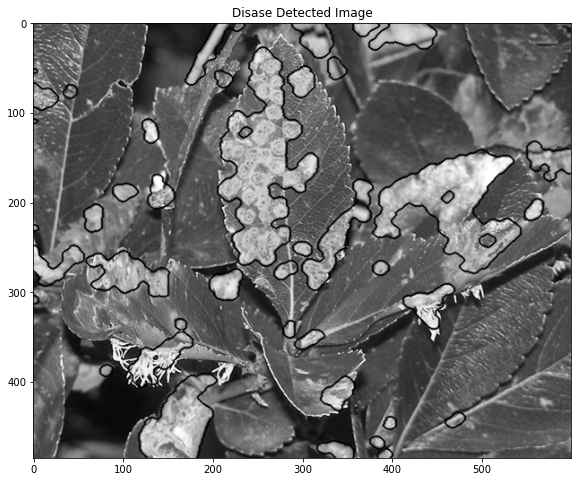

In [12]:
detect_disease(test, 2)

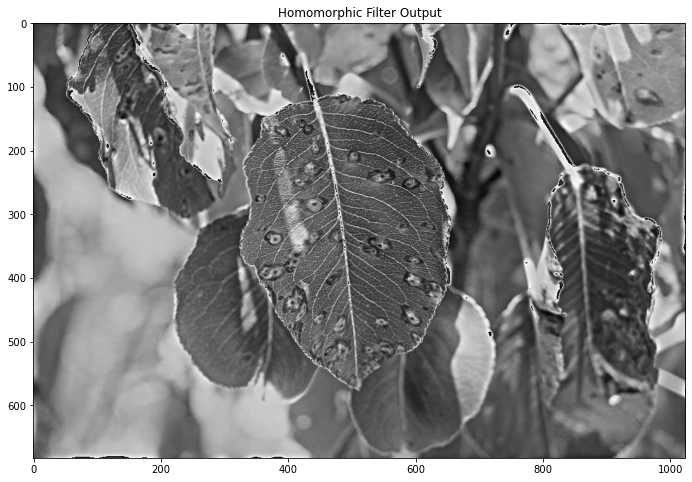

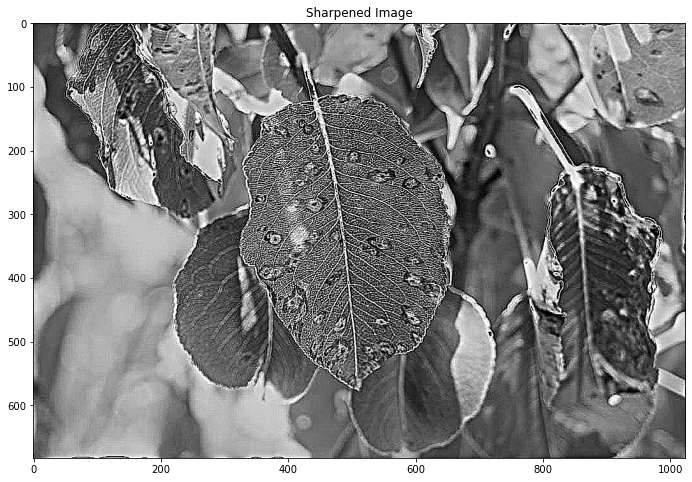

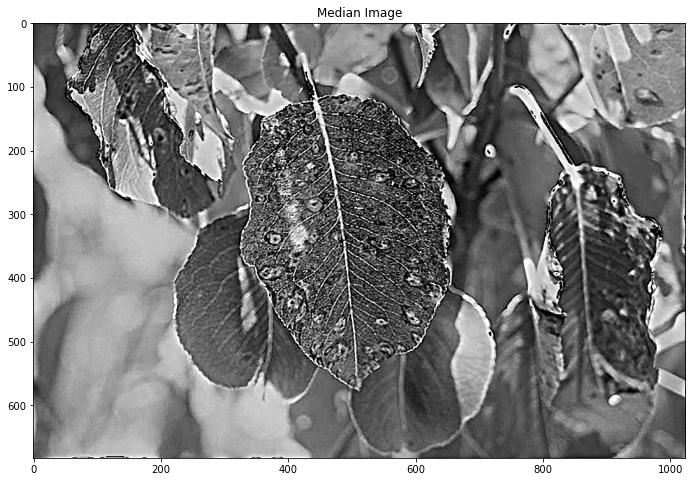

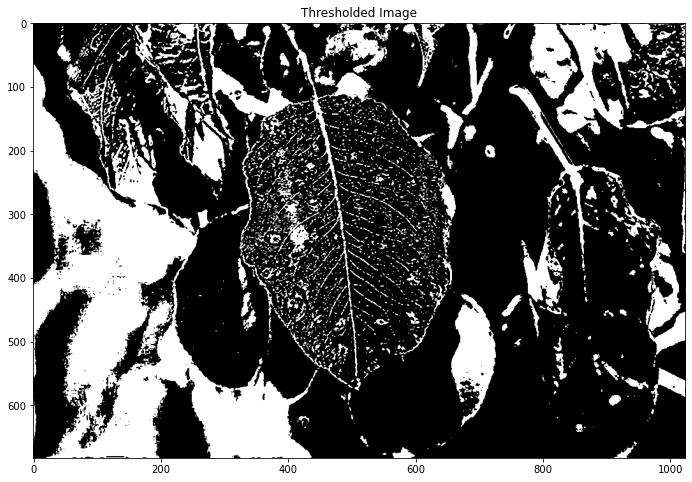

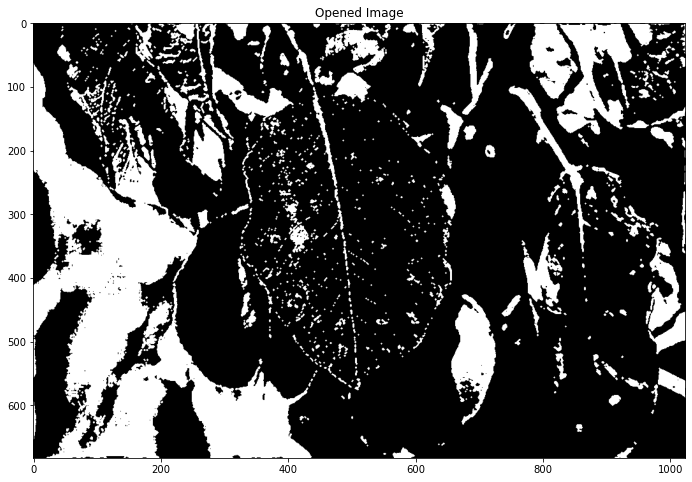

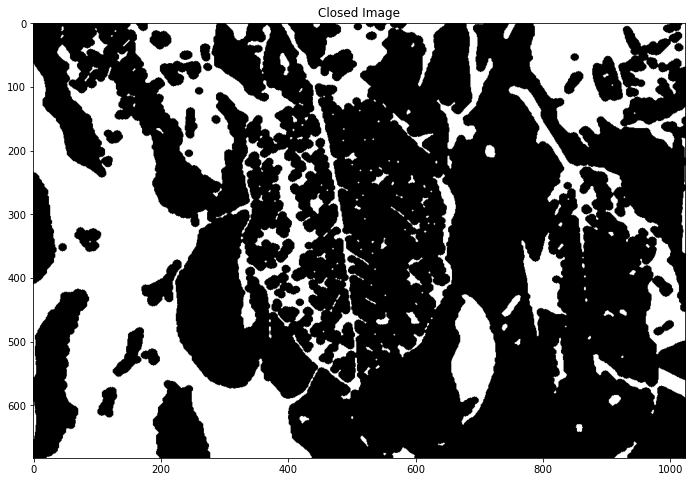

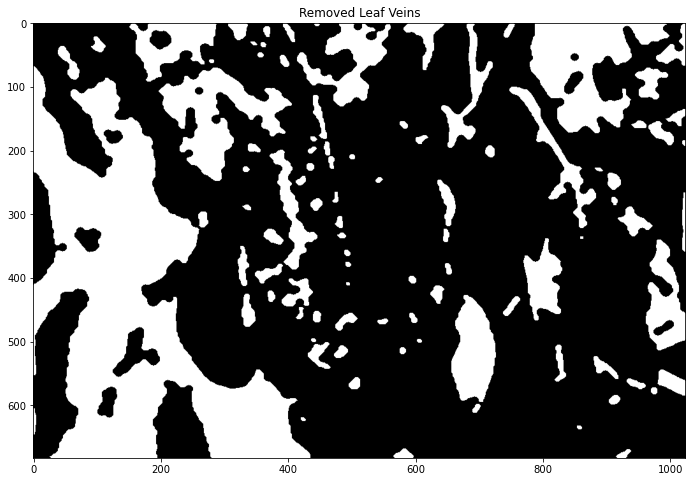

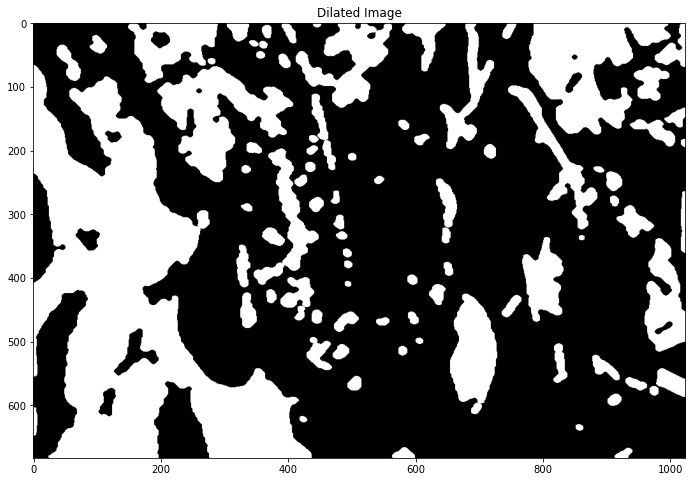

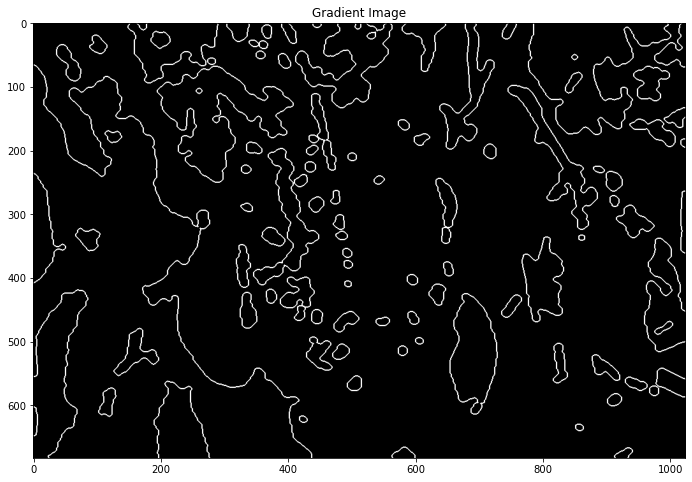

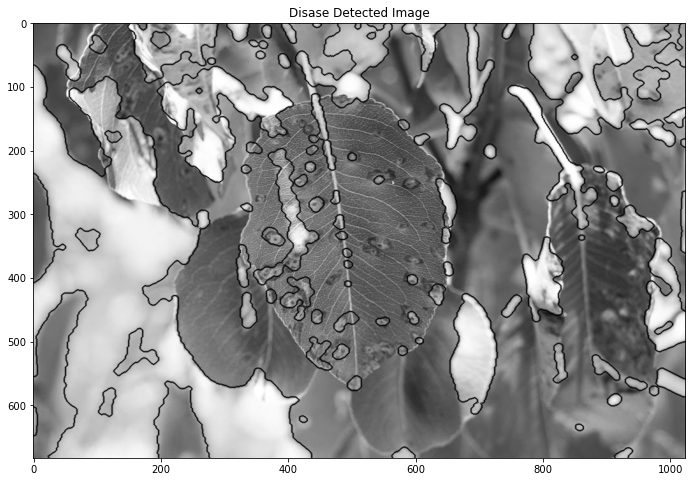

In [13]:
detect_disease(test, 3)